In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib
%matplotlib inline

In [2]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

In [87]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
proj_dir = "/home/sanaz/SDCND/CarND-Advanced-Lane-Lines/"

In [4]:
nx, ny = 9, 6

In [5]:
def get_corners(img_fn, nx, ny):
    img = cv2.imread(img_fn)
    # convert images to gray scale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    return ret, corners, img

In [6]:
def plot_corners(img, nx, ny, corners):
    out_img = cv2.drawChessboardCorners(img, (nx, ny), corners, True)
    plt.imshow(out_img)
    plt.show()

## Example of Perspective Transform on chessboard images

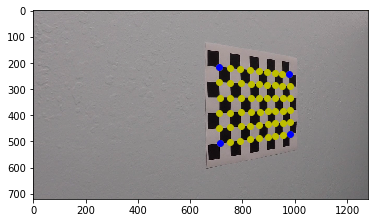

In [20]:
# Perspective Transform in general 
# get the corners

top_left = 0
top_right = nx - 1
bottom_left = nx * ny - nx
bottom_right = nx * ny - 1


sample_img_filename = "camera_cal/calibration8.jpg"
success, corners, img = get_corners(sample_img_filename, nx, ny)
plt.imshow(img)

# highlight 4 corners
n = (nx * ny) -nx
plt.scatter(corners[:,:, 0], corners[:,:, 1], color='y')

for n in [top_left, top_right, bottom_left, bottom_right]:
    plt.scatter([corners[:,:, 0][n]], [corners[:,:, 1][n]], color='blue')
    plt.savefig('./writeup_images/finding_corners.png')

In [13]:
def get_chess_source_destination_corners(img_fn, nx, ny, offset=100):
    success, corners, img = get_corners(img_fn, nx, ny)
    
    # get indices of corner corners
    top_left = 0
    top_right = nx - 1
    bottom_left = nx * ny - nx
    bottom_right = nx * ny - 1
    
    # dest coords (you might not want this to be the corners of the image)
    dst_top_left = (offset, offset)
    dst_top_right = (img.shape[1] - offset, offset)
    dst_bottom_left = (offset, img.shape[0] - offset)
    dst_bottom_right = (img.shape[1] - offset, img.shape[0] - offset)
    dst_coords = np.array(
        [dst_top_right,
        dst_bottom_right,
        dst_bottom_left,
        dst_top_left],
        dtype=np.float32
    )
    
    src_coords = []
    for n in [top_right, bottom_right, bottom_left, top_left]:
        src_coords.append((corners[:,:, 0][n], corners[:,:, 1][n]))
    
    return np.array(src_coords, dtype=np.float32)[:,:,0], dst_coords

In [24]:
src_coords, dst_coords = get_chess_source_destination_corners(sample_img_filename, nx, ny)

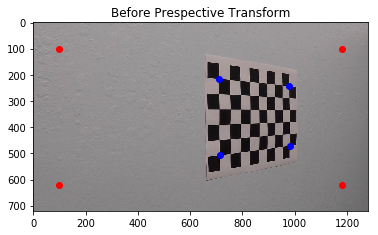

In [25]:
plt.imshow(cv2.imread(sample_img_filename))
plt.title('Before Prespective Transform')
plt.scatter([xy[0] for xy in src_coords], [xy[1] for xy in src_coords], color='blue')
plt.scatter([xy[0] for xy in dst_coords], [xy[1] for xy in dst_coords], color='r')
plt.savefig('./writeup_images/chess_board_before_pt.png')

In [30]:
# get perspective transform matrix and inverse
M_chess = cv2.getPerspectiveTransform(src_coords, dst_coords)
Minv_chess = cv2.getPerspectiveTransform(dst_coords, src_coords)

In [31]:
# apply perspective transform on chessboard image
warped = cv2.warpPerspective(img, M_chess, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)

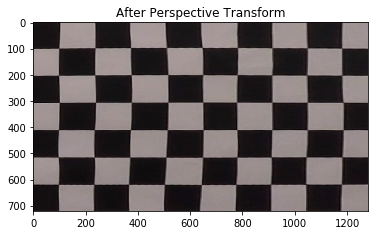

In [32]:
plt.title('After Perspective Transform')
plt.imshow(warped)
plt.savefig('./writeup_images/chess_board_after_pt.png')

In [85]:
# plot source and destination coordinates for perspective trasnform 
def _show_persp_transform_coords(masked, src_coords,dst_coords):
    plt.scatter([xy[0] for xy in src_coords], [xy[1] for xy in src_coords], color='blue')
    plt.scatter([xy[0] for xy in dst_coords], [xy[1] for xy in dst_coords], color='red', s=100)
    plt.title('Perfespective Transform Source and Destination Coordinates')
    plt.imshow(masked, cmap='gray')
    plt.savefig('./writeup_images/persp_transform_coords_for_vidframes.png')

In [71]:
# get the transformation matrix and its inverse
def get_persp_transform_matrices(src_coords, dst_coords):
    M = cv2.getPerspectiveTransform(src_coords, dst_coords)
    Minv = cv2.getPerspectiveTransform(dst_coords, src_coords)
    return M, Minv

In [72]:
# transform from normal to birdseye view
def persp_transform_to_birdseye(image, M):
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    return warped 

In [73]:
# transform from birdseye to normal view
def persp_transform_to_normal(warped_image, Minv):
    unwarped = cv2.warpPerspective(warped_image, Minv, (warped_image.shape[1], warped_image.shape[0]))
    return unwarped
     

## Camera Calibration -- find the calibration matrix to be applied to all future images

In [34]:
# read in chessboard images to be used to get the calibration matrix
calib_images = glob.glob('camera_cal/calibration*')

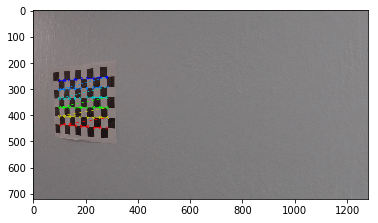

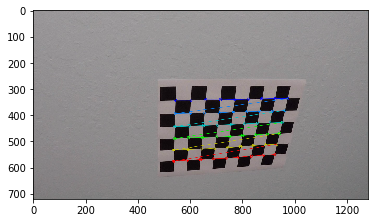

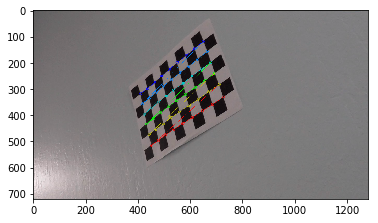

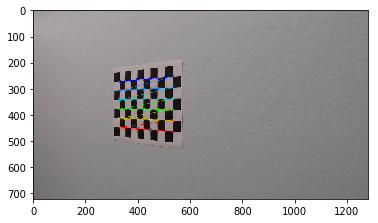

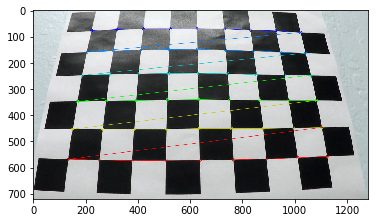

...

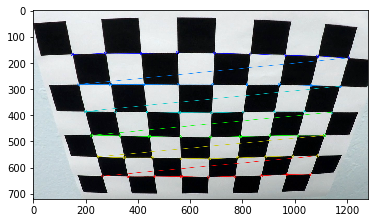

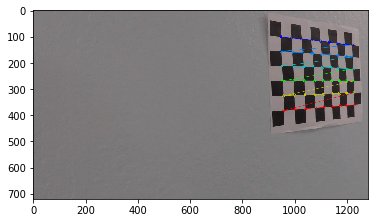

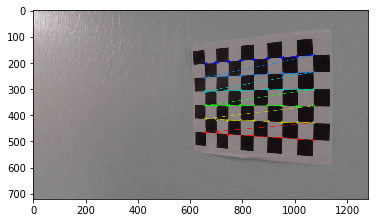

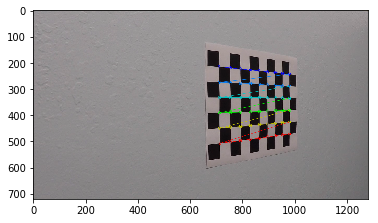

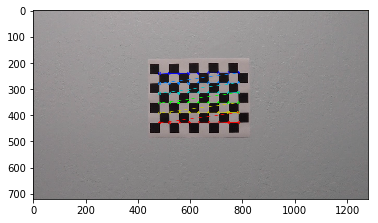

camera_cal/calibration4.jpg failed


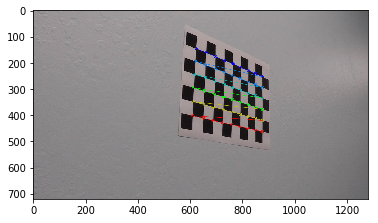

camera_cal/calibration1.jpg failed


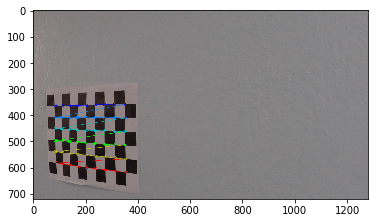

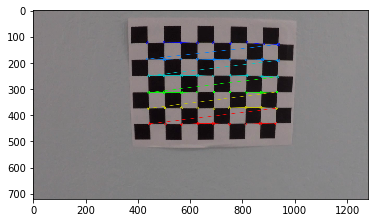

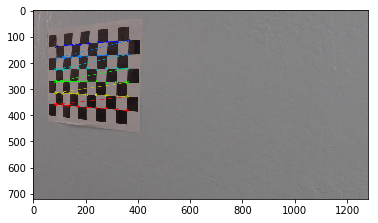

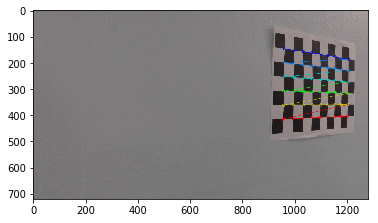

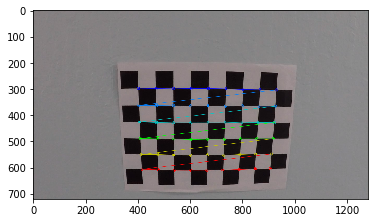

camera_cal/calibration5.jpg failed


In [35]:
# create object point and image point arrays to be used for calibration matrix calculations
objpoints = []
imgpoints = []

# create the object points array
objp = np.zeros((nx*ny, 3), np.float32)
objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)


for img_fn in calib_images:
    success, corners, img = get_corners(img_fn, nx, ny)
    if success:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        plot_corners(img, nx, ny, corners)
    else:
        print("{} failed".format(img_fn))
    

In [36]:
# finding the recalbration matrix for this camera
image_size = cv2.imread(calib_images[0]).shape[0:2]
ret, calib_mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, image_size[::-1], None, None)

In [37]:
# the calibration matrix for this camera
calib_mtx

array([[  1.15396093e+03,   0.00000000e+00,   6.69705357e+02],
       [  0.00000000e+00,   1.14802496e+03,   3.85656234e+02],
       [  0.00000000e+00,   0.00000000e+00,   1.00000000e+00]])

In [38]:
dist

array([[ -2.41017956e-01,  -5.30721172e-02,  -1.15810355e-03,
         -1.28318857e-04,   2.67125292e-02]])

In [28]:
# Apply it on chessboard images for the rubric 

camera_cal/calibration11.jpg


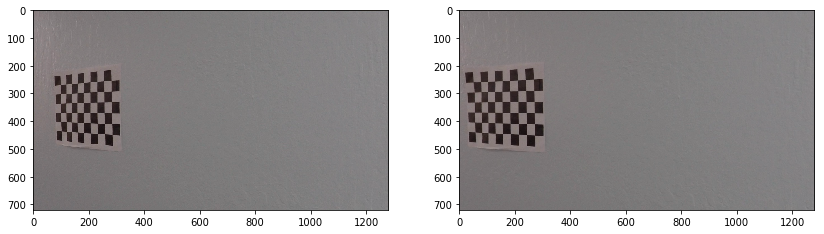

camera_cal/calibration10.jpg


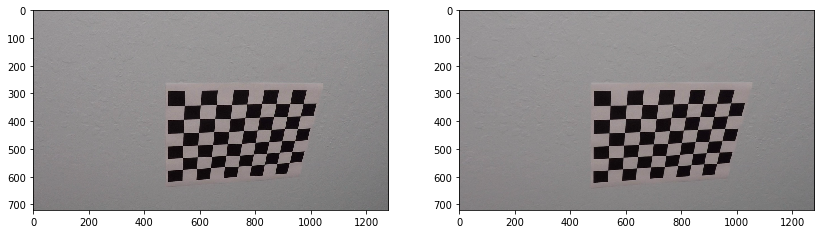

camera_cal/calibration13.jpg


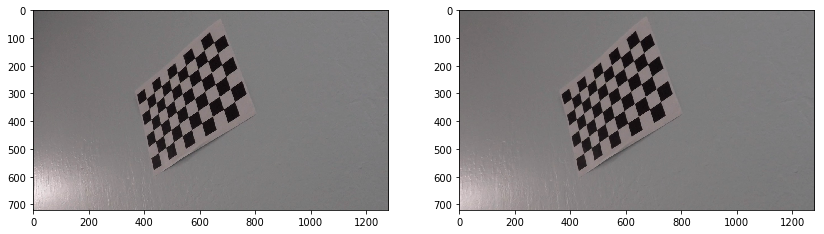

camera_cal/calibration7.jpg


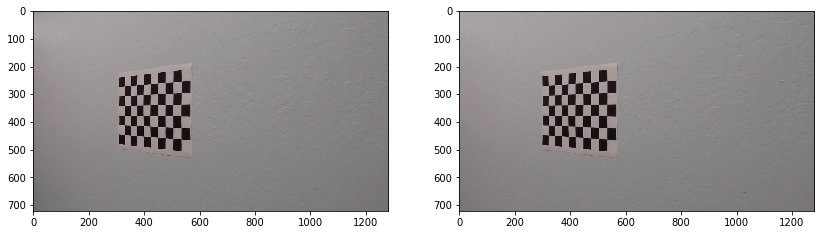

camera_cal/calibration3.jpg


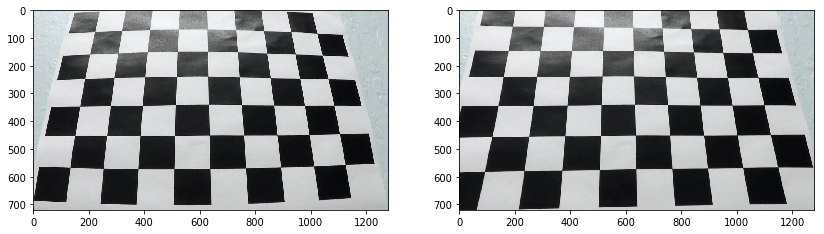

camera_cal/calibration15.jpg


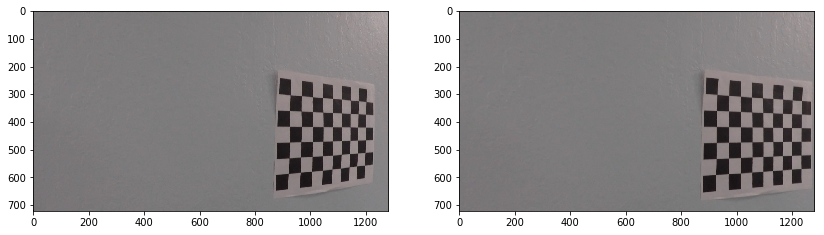

camera_cal/calibration2.jpg


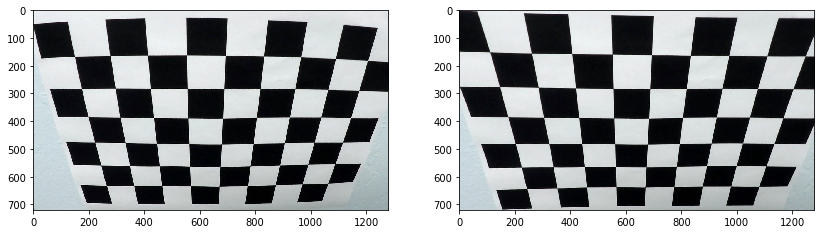

camera_cal/calibration16.jpg


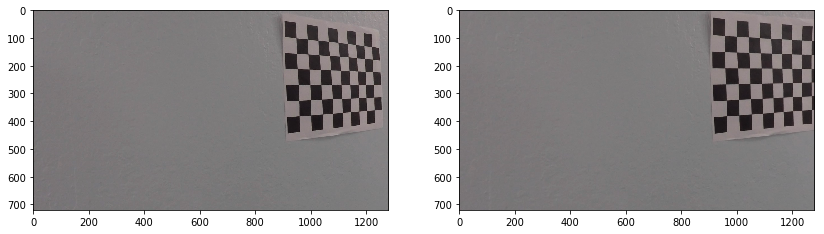

camera_cal/calibration12.jpg


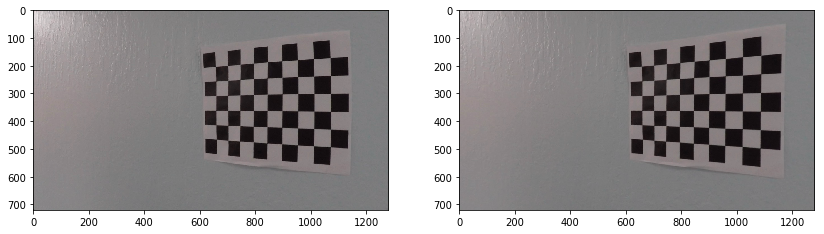

camera_cal/calibration8.jpg


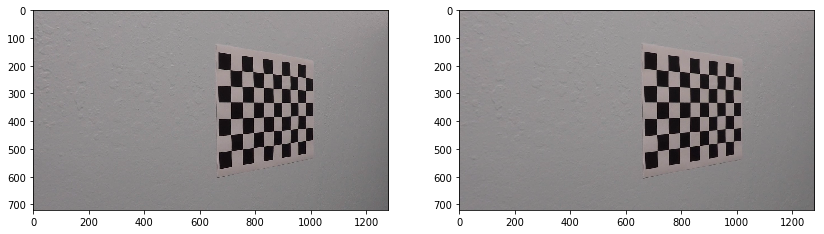

camera_cal/calibration6.jpg


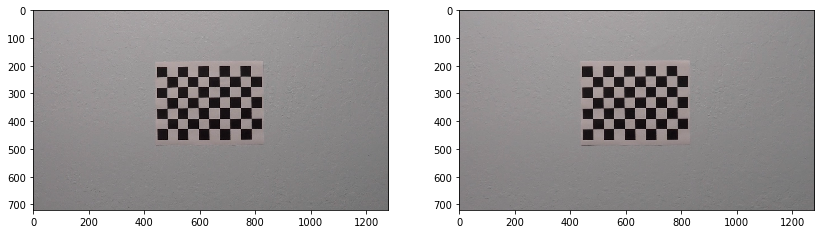

camera_cal/calibration4.jpg


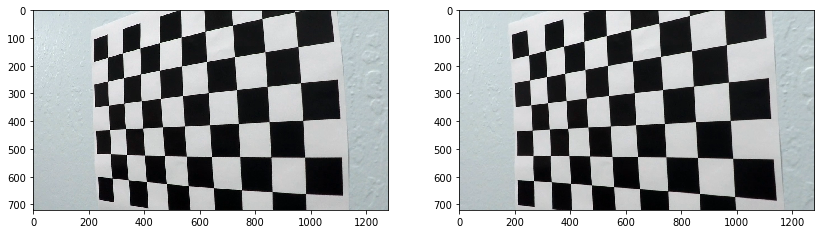

camera_cal/calibration9.jpg


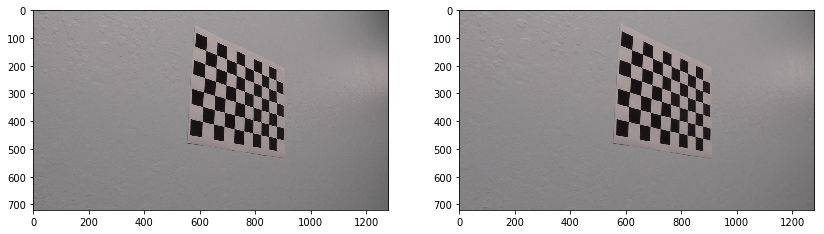

camera_cal/calibration1.jpg


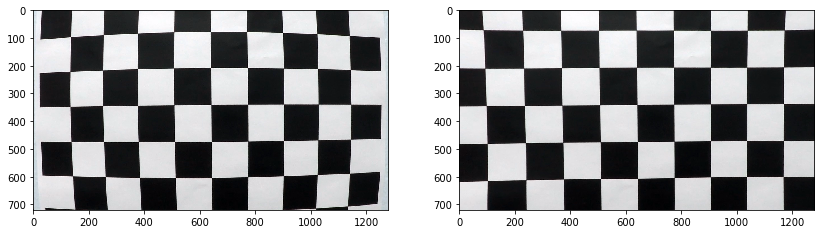

camera_cal/calibration20.jpg


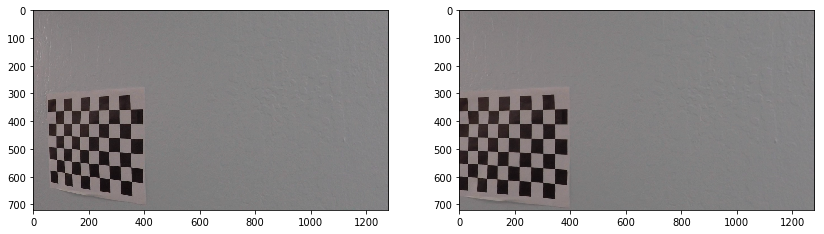

camera_cal/calibration18.jpg


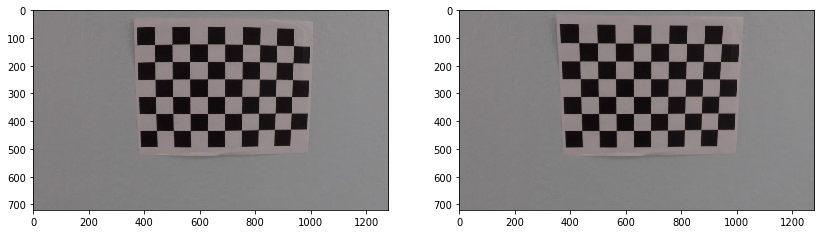

camera_cal/calibration19.jpg


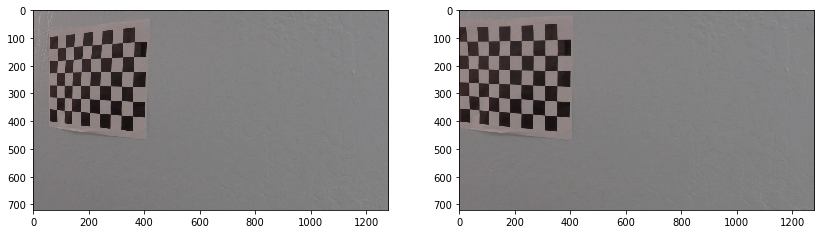

camera_cal/calibration14.jpg


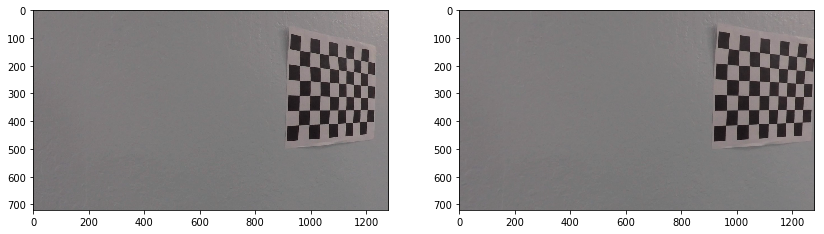

camera_cal/calibration17.jpg


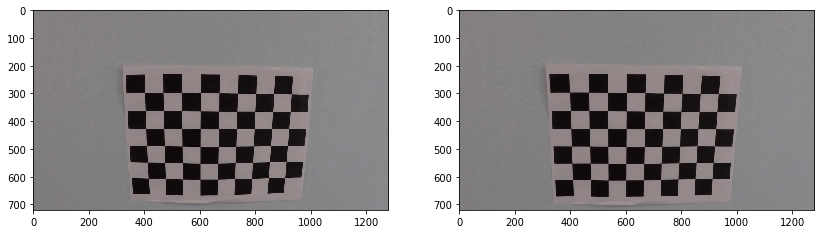

camera_cal/calibration5.jpg


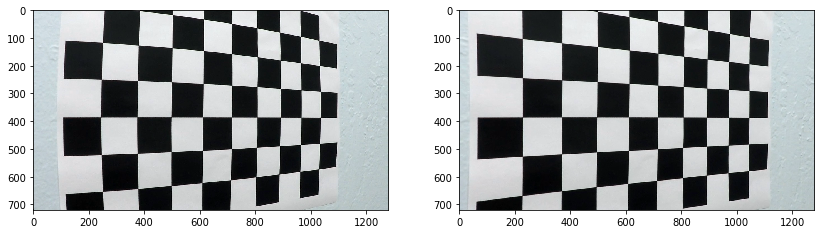

In [29]:
# try it on fake chessboard images
for img_fn in calib_images: # to show that the corner distortions will go away after recalibration
    img = cv2.imread(img_fn)
    dst = cv2.undistort(img, calib_mtx, dist, None, calib_mtx)
    f, axes = plt.subplots(1,2, figsize=[14,6])
    axes[0].imshow(img,cmap='gray')
    axes[1].imshow(dst,cmap='gray')
    print(img_fn)
    plt.show()

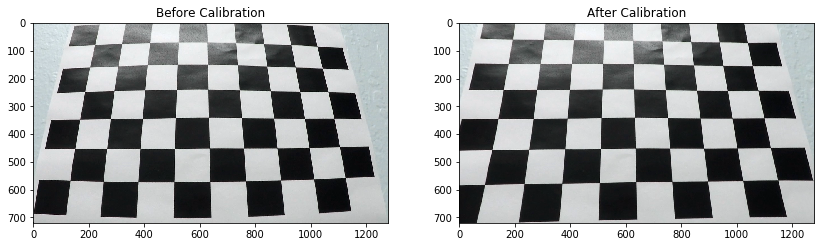

In [48]:
img = cv2.imread(calib_images[4])
dst = cv2.undistort(img, calib_mtx, dist, None, calib_mtx)
f, axes = plt.subplots(1,2, figsize=[14,6])
axes[0].imshow(img,cmap='gray')
axes[1].imshow(dst,cmap='gray')
axes[0].set_title('Before Calibration')
axes[1].set_title('After Calibration')
f.savefig('./writeup_images/chessboard_before_after_calib.png')
plt.show()

In [30]:
# Apply it on actual test images

In [50]:
test_images = glob.glob('test_images/*')

test_images/test2.jpg


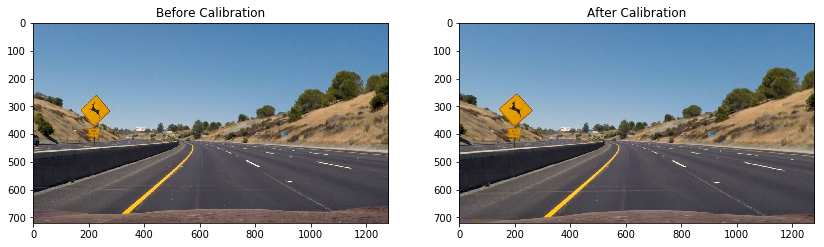

test_images/straight_lines1.jpg


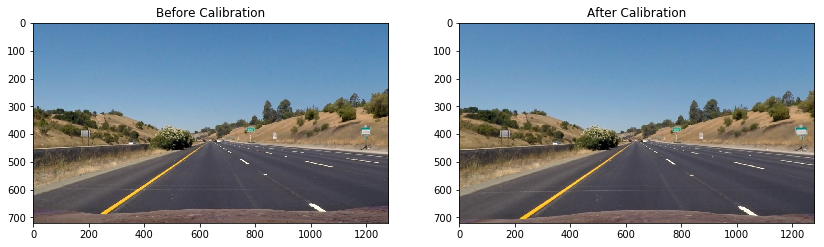

test_images/test4.jpg


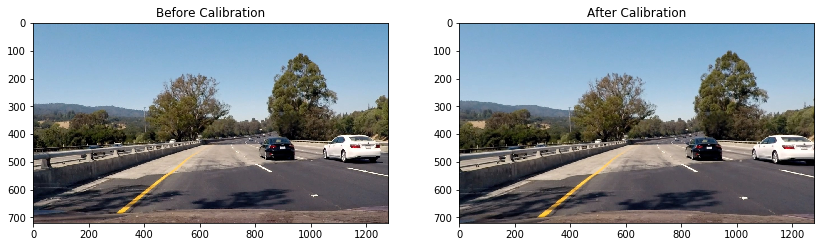

test_images/test5.jpg


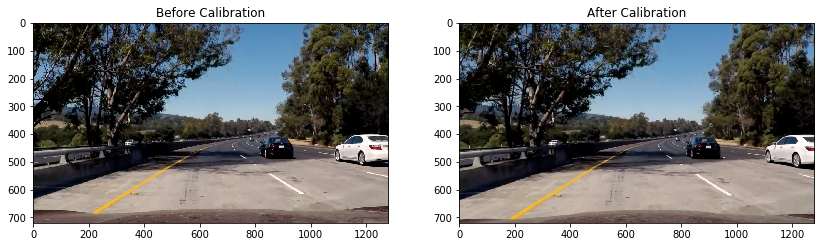

test_images/straight_lines2.jpg


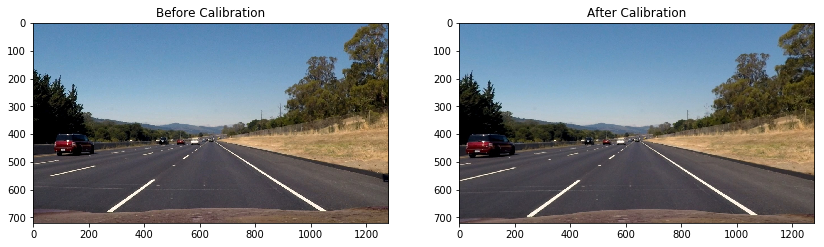

test_images/test3.jpg


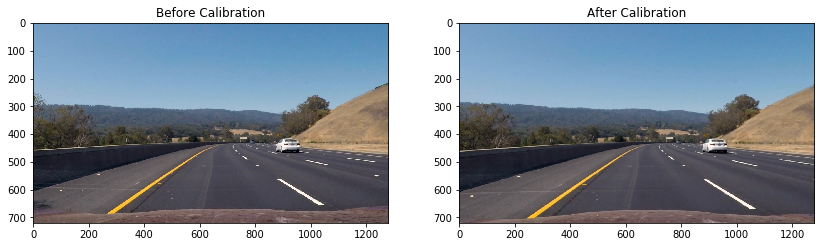

test_images/test6.jpg


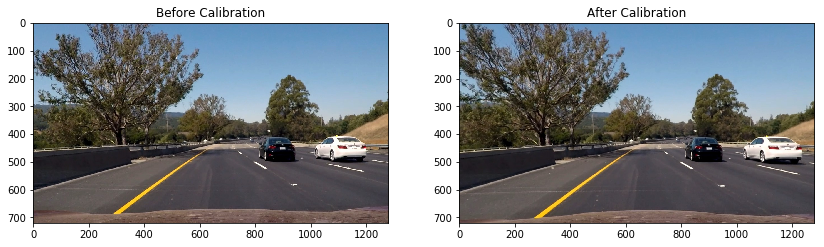

test_images/test1.jpg


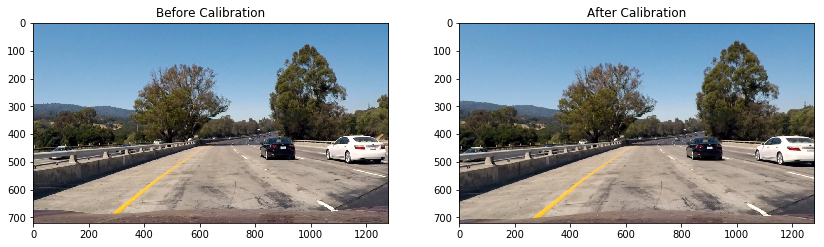

In [52]:
# now apply it to actual images
for img_fn in test_images:

    #img = cv2.imread(img_fn)
    img = mpimg.imread(img_fn)
    dst = cv2.undistort(img, calib_mtx, dist, None, calib_mtx)
    f, axes = plt.subplots(1,2, figsize=[14,6])
    axes[0].imshow(img,cmap='gray')
    axes[1].imshow(dst,cmap='gray')
    axes[0].set_title('Before Calibration')
    axes[1].set_title('After Calibration')
    print(img_fn)
    plt.show()
    
f.savefig('./writeup_images/testimage_before_after_calib.png')

In [53]:
# function for undistorting images -- first step in the pipeline
# STEP 1 IN THE PIPELINE
def undistort_images(image, calibration_mtx, dist):
    undistored = cv2.undistort(image, calibration_mtx, dist, None, calibration_mtx)
    return undistored

In [54]:
# Mask Function

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [57]:
# mask coordinates
imshape = image_size

bottom_left  = (0, imshape[0]) 
mid_bottom_left  = (0, imshape[0]-70) 
bottom_right = (imshape[1],imshape[0])
top_left = (imshape[1]*0.45,imshape[0]*0.6)
top_right = (imshape[1]*0.55,imshape[0]*0.6)
print(bottom_left, top_left, top_right, bottom_right)


vertices = np.array([[bottom_left, mid_bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)

(0, 720) (576.0, 432.0) (704.0, 432.0) (1280, 720)


In [58]:
masked_sample = region_of_interest(np.ones_like(img)[:,:,0], vertices)

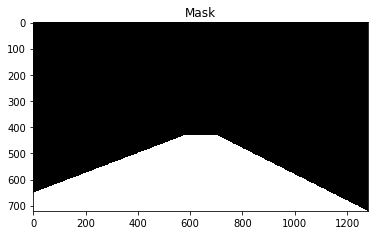

In [60]:
plt.imshow(masked_sample, cmap='gray')
plt.title('Mask')
plt.savefig('./writeup_images/mask_file.png')

In [61]:
# function to mask a binary image
def mask(binary_image, vertices):
    return region_of_interest(binary_image, vertices)

In [98]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255), plot=False):
    gray_img = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    if orient == 'x':
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(gray_img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        
        
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    
    
    if plot:
        plt.figure(figsize=[10,5])
        plt.imshow(binary_output, cmap='gray')
        plt.title('Sobel Gradient Direction in '+str(orient)+' direction.')
        plt.savefig('./writeup_images/Sobel_direction_'+str(orient)+'.png')
    
    
    # Return the result
    return binary_output



def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255), plot=False):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    
    
    if plot:
        plt.figure(figsize=[10,5])
        plt.imshow(binary_output, cmap='gray')
        plt.title('Sobel Gradient Magnitude')
        plt.savefig('./writeup_images/Sobel_magnitude.png')

    # Return the binary image
    return binary_output


def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2), plot=False):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.abs(np.arctan(np.absolute(sobely)/ np.absolute(sobelx)))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    
    if plot:
        plt.figure(figsize=[10,5])
        plt.imshow(binary_output, cmap='gray')
        plt.title('Sobel Gradient Direction')
        plt.savefig('./writeup_images/Sobel_direction.png')

    # Return the binary image
    return binary_output

In [99]:
def hls_select(image, thresh=(0, 255), plot=False):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    if plot:
        plt.figure(figsize=[10,5])
        plt.imshow(binary_output, cmap='gray')
        plt.title('S channel in HSL color space')
        plt.savefig('./writeup_images/Color_threshold.png')
    
    return binary_output

In [100]:
def binary_threshold_pipeline(image):
    
    ksize = 9
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 200),plot=False)
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 200), plot=False)
    
    
    ksize = 11
    mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(40, 200), plot=False)
    dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3), plot=False)
    color_binary = hls_select(image, thresh=(85, 255), plot=False)
    
    
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1)& (grady == 1) ) | ((mag_binary == 1) & (dir_binary == 1)) | (color_binary == 1)] = 1
    
    
    return combined

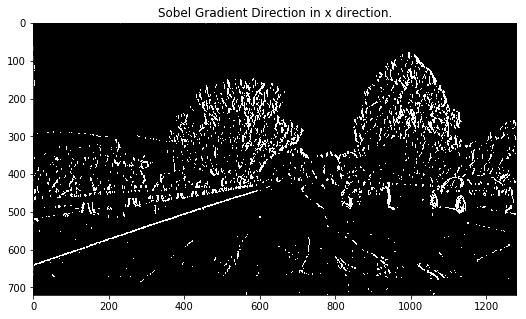

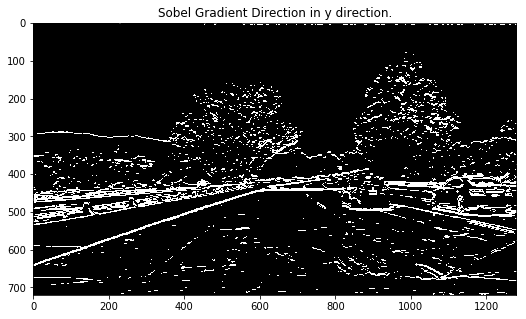

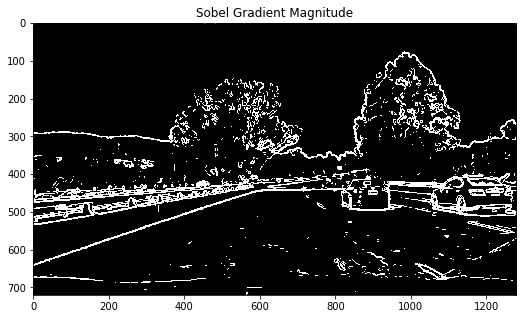

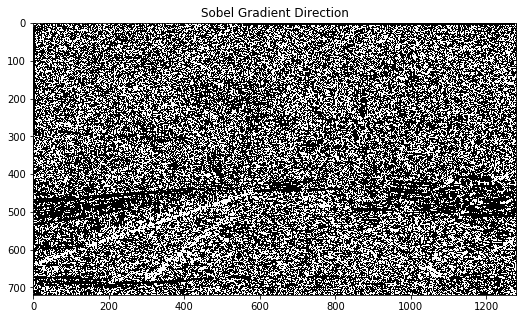

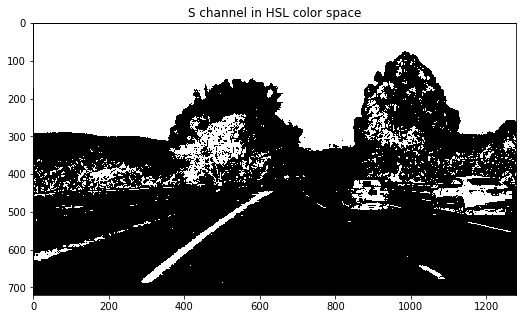

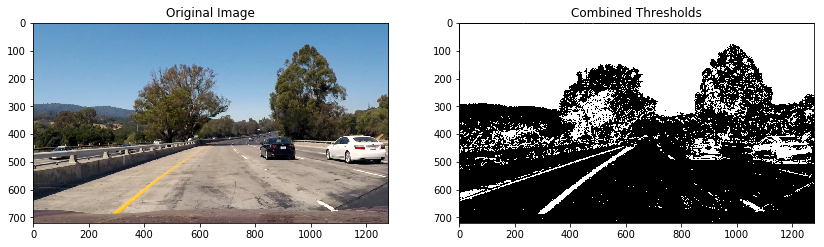

In [101]:
# plot for the writeup

image = img.copy()
ksize = 9

gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 200),plot=True)
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 200), plot=True)


ksize = 11
mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(40, 200), plot=True)
dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3), plot=True)
color_binary = hls_select(image, thresh=(85, 255), plot=True)


combined = np.zeros_like(dir_binary)
combined[((gradx == 1)& (grady == 1) ) | ((mag_binary == 1) & (dir_binary == 1)) | (color_binary == 1)] = 1
f, axes = plt.subplots(1,2, figsize=[14,6])
axes[0].imshow(img,cmap='gray')
axes[1].imshow(combined,cmap='gray')
axes[0].set_title('Original Image')
axes[1].set_title('Combined Thresholds')
plt.savefig('./writeup_images/image_and_combined_threshold.png')


## Perspective tranform for the project frames

In [65]:
imshape = (1280,720)

In [66]:
imshape

(1280, 720)

### Source coords

In [102]:
# select source coords for perspective transform
bottom_left  = [0+60, imshape[1]]
bottom_right = [imshape[0]-60,imshape[1]]
top_left = [imshape[0]/2.-100,imshape[1]/2.+100]
top_right = [imshape[0]/2.+100,imshape[1]/2.+100]

src_coords = []
for n in [top_right, bottom_right, bottom_left, top_left]:
    src_coords.append(n)
print(src_coords)    

[[740.0, 460.0], [1220, 720], [60, 720], [540.0, 460.0]]


### Destination coords

In [103]:
# select destination coords for perspective transform
bottom_left  = [0, imshape[1]]
bottom_right = [imshape[0],imshape[1]]
top_left = [0,0]
top_right = [imshape[0],0]

dst_coords = []
for n in [top_right, bottom_right, bottom_left, top_left]:
    dst_coords.append(n)
print(dst_coords)    



[[1280, 0], [1280, 720], [0, 720], [0, 0]]


### Perspective Transform and Inverse Matrices

In [104]:
M, Minv = get_persp_transform_matrices(np.array(src_coords, dtype=np.float32), np.array(dst_coords, dtype=np.float32))

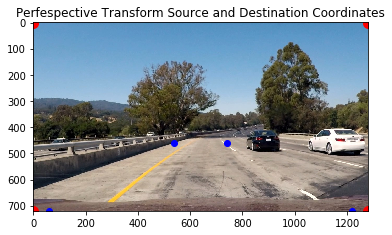

In [105]:
# display them
_show_persp_transform_coords(img,src_coords, dst_coords)


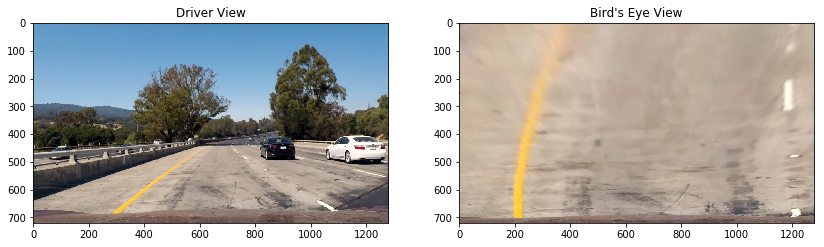

In [106]:
birds_view = persp_transform_to_birdseye(img, M)
f, axes = plt.subplots(1,2, figsize=[14,6])
axes[0].imshow(img,cmap='gray')
axes[1].imshow(birds_view,cmap='gray')
axes[0].set_title('Driver View')
axes[1].set_title('Bird\'s Eye View')
plt.savefig('./writeup_images/driver_and_birdseye_view.png')
#print(img_fn)
plt.show()

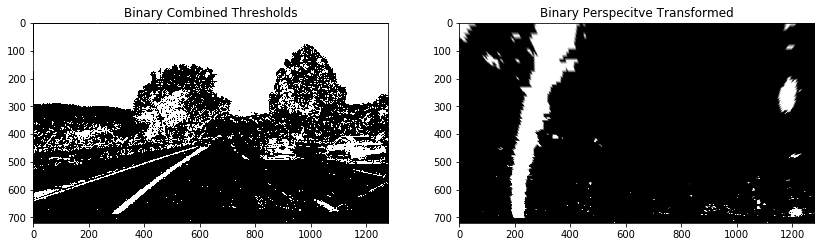

In [124]:
bird_binary = persp_transform_to_birdseye(combined, M)
f, axes = plt.subplots(1,2, figsize=[14,6])
axes[0].imshow(combined,cmap='gray')
axes[1].imshow(bird_binary,cmap='gray')
axes[0].set_title('Binary Combined Thresholds')
axes[1].set_title('Binary Perspecitve Transformed')
plt.savefig('./writeup_images/binary_driver_and_birds.png')
#print(img_fn)
plt.show()

In [169]:
def get_polyfits(binary_warped): # for the first frame
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

   
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_lane_inds, right_lane_inds, left_fit, right_fit,out_img



In [170]:
# get the polynomial fit based on the fit parameters
def get_left_right_fitx(binary_warped, left_fit, right_fit):
        
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        return ploty, left_fitx, right_fitx
    

In [241]:
# Generate x and y values for plotting over the pixel images
def draw_poly_fit_lines(binary_warped):
    
    left_lane_inds, right_lane_inds, left_fit, right_fit, out_img = get_polyfits(binary_warped)
    ploty, left_fitx, right_fitx = get_left_right_fitx(binary_warped, left_fit, right_fit)

    
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    
    f, axes = plt.subplots(1,2, figsize=[14,6])
    axes[0].imshow(binary_warped,cmap='gray')
    axes[1].imshow(out_img*255)
    axes[1].plot(left_fitx, ploty, color='yellow', linewidth=3)
    axes[1].plot(right_fitx, ploty, color='yellow',  linewidth=3)
    axes[1].set_xlim(0, 1280)
    axes[1].set_ylim(720, 0)
    axes[0].set_title('Binary Combined Thresholds')
    axes[1].set_title('Binary First Frame Search in Windows')
    plt.savefig('./writeup_images/binary_first_frame_fit.png')
    


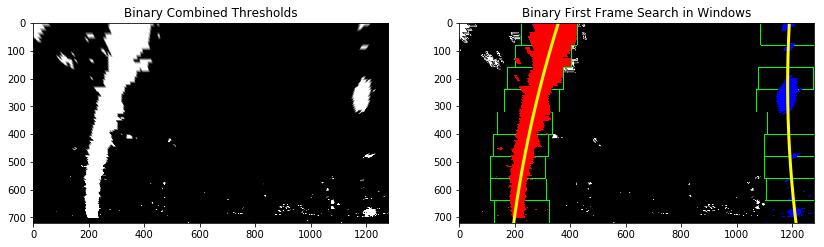

In [242]:
draw_poly_fit_lines(binary_warped.copy())

In [770]:
# for second image onwards

In [208]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!

def get_polyfits_second_frame_on(binary_warped, left_fit, right_fit):
    margin = 100
    #left_lane_inds, right_lane_inds, left_fit, right_fit = get_polyfits(binary_warped)
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    
    return left_lane_inds, right_lane_inds, left_fit, right_fit 
    
    
  

    

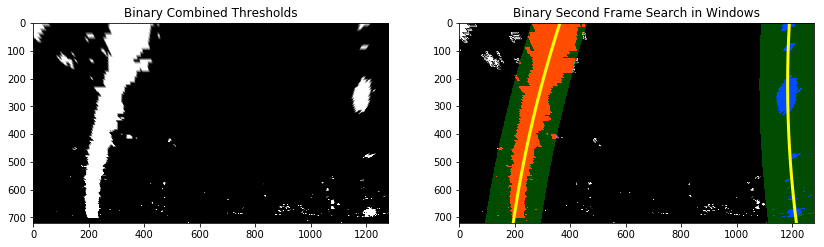

In [243]:

# Create an image to draw on and an image to show the selection window
def draw_poly_fit_lines_second_frame(binary_warped, left_fit, right_fit):
     
    left_lane_inds, right_lane_inds, left_fit, right_fit = get_polyfits_second_frame_on(binary_warped, \
                                                                                                     left_fit,right_fit)
    ploty, left_fitx, right_fitx = get_left_right_fitx(binary_warped, left_fit, right_fit)
    
    margin = 100
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
   
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    
    
    
    f, axes = plt.subplots(1,2, figsize=[14,6])
    axes[0].imshow(binary_warped,cmap='gray')
    axes[1].imshow(result*255)
    axes[1].plot(left_fitx, ploty, color='yellow', linewidth=3)
    axes[1].plot(right_fitx, ploty, color='yellow',  linewidth=3)
    axes[1].set_xlim(0, 1280)
    axes[1].set_ylim(720, 0)
    axes[0].set_title('Binary Combined Thresholds')
    axes[1].set_title('Binary Second Frame Search in Windows')
    plt.savefig('./writeup_images/binary_second_frame_fit.png')
    
    
left_lane_inds, right_lane_inds, left_fit, right_fit, out_img = get_polyfits(binary_warped.copy())    
draw_poly_fit_lines_second_frame(binary_warped.copy(),left_fit, right_fit)

In [244]:
# Define conversions in x and y from pixels space to meters
def get_radius_of_curvature(ploty, left_fitx, right_fitx):
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    return left_curverad, right_curverad



In [245]:
# transform back to driver's perspective

In [246]:
left_fit = None
right_fit = None
flag = 0
def unwarp_safe_lanes(binary_warped, original_image, Minv):
    
    global left_fit
    global right_fit
    global flag
    warped = binary_warped.copy()
    undist = original_image.copy()
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    if flag == 0:
        
        left_lane_inds, right_lane_inds, left_fit, right_fit, out_img = get_polyfits(binary_warped)
        flag = 1
        
    else:
        
        left_lane_inds, right_lane_inds, left_fit, right_fit = get_polyfits_second_frame_on(binary_warped, left_fit, right_fit)
        
        
    ploty, left_fitx, right_fitx = get_left_right_fitx(binary_warped, left_fit, right_fit)
    
    
    
    left_curverad, right_curverad = get_radius_of_curvature(ploty, left_fitx, right_fitx)
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = persp_transform_to_normal(color_warp, Minv)
    

    driver_result = cv2.addWeighted(np.uint8(undist), 1, newwarp, 0.4, 0) 
    
     #font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    font = cv2.FONT_HERSHEY_SIMPLEX
    rl = round((left_curverad+right_curverad)/2.,0)
    
    
    xm_per_pix = 3.7/700
    left_mean = np.mean(left_fitx)
    right_mean = np.mean(right_fitx)
    camera_pos = round(((binary_warped.shape[1]/2)-np.mean([left_mean, right_mean]))*xm_per_pix,2)
    
    
    
    cv2.putText(driver_result,'Radius of Curvature: ' + str(rl) + ' m',(10,30), font, 1,(255,255,255),3)
    cv2.putText(driver_result,'Vehicle Position: ' + str(camera_pos) + ' m',(600,30), font, 1,(255,255,255),3)
    
    return left_curverad, right_curverad, driver_result

In [247]:
def entire_pipeline(input_image):
    undist = undistort_images(input_image, calib_mtx, dist)

    threshold_result = pipeline(undist)*255.
    masked = mask(threshold_result, vertices)
    
    bird = persp_transform_to_birdseye(masked, M)
    l ,r, unwarped = unwarp_safe_lanes(bird, undist, Minv)

    return unwarped


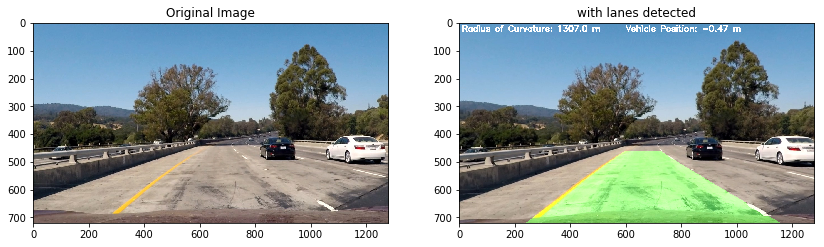

In [121]:
unwarped = entire_pipeline(img)
f, axes = plt.subplots(1,2, figsize=[14,6])
axes[0].imshow(img,cmap='gray')
axes[1].imshow(unwarped,cmap='gray')
axes[0].set_title('Original Image')
axes[1].set_title('with lanes detected')
plt.savefig('./writeup_images/image_and_green_lanes.png')
#print(img_fn)
plt.show()

# Test on vide

In [248]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [249]:
clip_in = VideoFileClip('./project_video.mp4')
clip_out = clip_in.fl_image(entire_pipeline)
clip_out.write_videofile('./finding_advanced_lanes.mp4', audio=False)

[MoviePy] >>>> Building video ./finding_advanced_lanes.mp4
[MoviePy] Writing video ./finding_advanced_lanes.mp4


100%|█████████▉| 1260/1261 [05:19<00:00,  4.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./finding_advanced_lanes.mp4 



In [74]:
# newclip = clip_in.subclip(41,42)
# newclip.fps
# newclip.write_images_sequence('./hard_frames/frame%03d.jpg')